In [ ]:
%matplotlib inline
from icevision import *
from icedata import *

In [ ]:
# Create the parser
parser = parsers.VOCBBoxParser(
    annotations_dir="dataset/labels",
    images_dir="dataset/data",
)

In [ ]:
# Parse annotations to create records
train_records, valid_records = parser.parse(data_splitter=RandomSplitter([0.9, 0.1]))
parser.class_map

In [ ]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 384
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [ ]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[2] for _ in range(3)]
show_samples(samples, ncols=3)

In [38]:
model_type = models.ultralytics.yolov5
backbone = model_type.backbones.medium
# The yolov5 model requires an img_size parameter
extra_args = {}
extra_args['img_size'] = image_size

# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args) 

09/12/2022 23:30:12 - INFO - yolov5.models.yolo -   Overriding model.yaml nc=80 with nc=2
09/12/2022 23:30:12 - INFO - yolov5.models.yolo -   
                 from  n    params  module                                  arguments                     
09/12/2022 23:30:12 - INFO - yolov5.models.yolo -     0                -1  1      5280  yolov5.models.common.Conv               [3, 48, 6, 2, 2]              
09/12/2022 23:30:12 - INFO - yolov5.models.yolo -     1                -1  1     41664  yolov5.models.common.Conv               [48, 96, 3, 2]                
09/12/2022 23:30:12 - INFO - yolov5.models.yolo -     2                -1  2     65280  yolov5.models.common.C3                 [96, 96, 2]                   
09/12/2022 23:30:12 - INFO - yolov5.models.yolo -     3                -1  1    166272  yolov5.models.common.Conv               [96, 192, 3, 2]               
09/12/2022 23:30:12 - INFO - yolov5.models.yolo -     4                -1  4    444672  yolov5.models.common.C3   

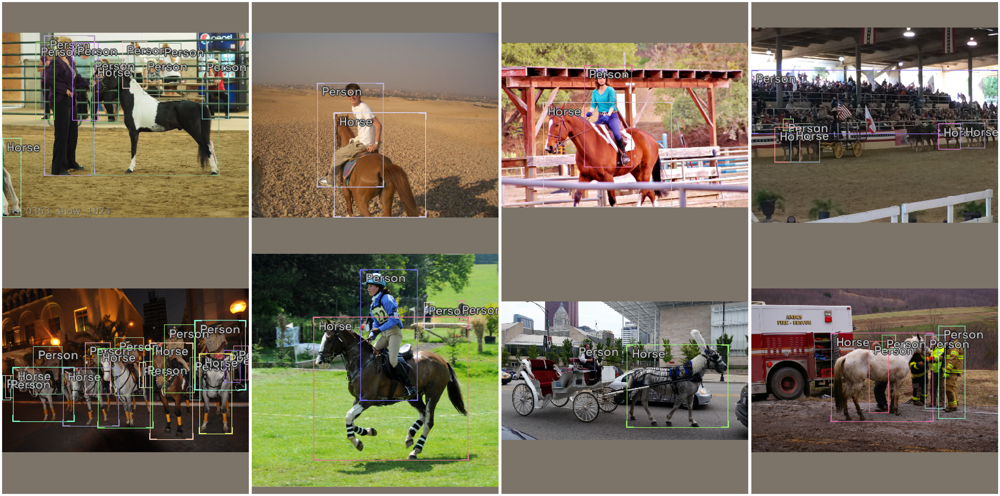

In [39]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

# Show batch
model_type.show_batch(next(iter(valid_dl)), ncols=4)

SuggestedLRs(valley=0.0030199517495930195)

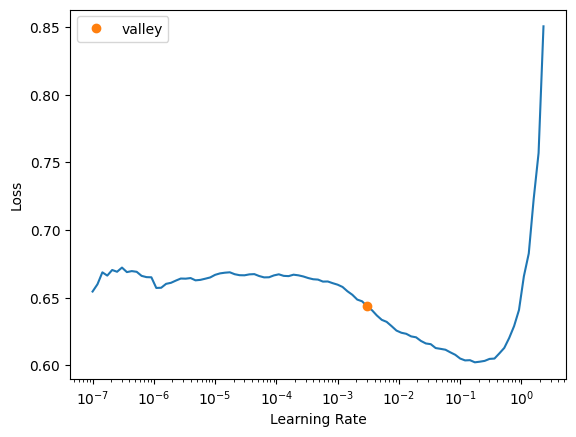

In [40]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]
learn = model_type.fastai.learner(
    dls=[train_dl, valid_dl], model=model, metrics=metrics
)
learn.lr_find()

In [27]:
learn.fine_tune(50, 0.0030199517495930195, freeze_epochs=1)


epoch,train_loss,valid_loss,COCOMetric,time
0,0.253033,0.295380,0.432334,00:29


epoch,train_loss,valid_loss,COCOMetric,time
0,0.246095,0.286278,0.459003,00:34
1,0.246633,0.287029,0.449113,00:35
2,0.250582,0.301016,0.421031,00:35
3,0.258561,0.294694,0.448090,00:35
4,0.258787,0.301942,0.426956,00:34
5,0.260993,0.307150,0.405487,00:35
6,0.261790,0.306335,0.398211,00:35
7,0.260561,0.305219,0.415925,00:34
8,0.254339,0.307958,0.418794,00:34
9,0.249425,0.302437,0.423812,00:33


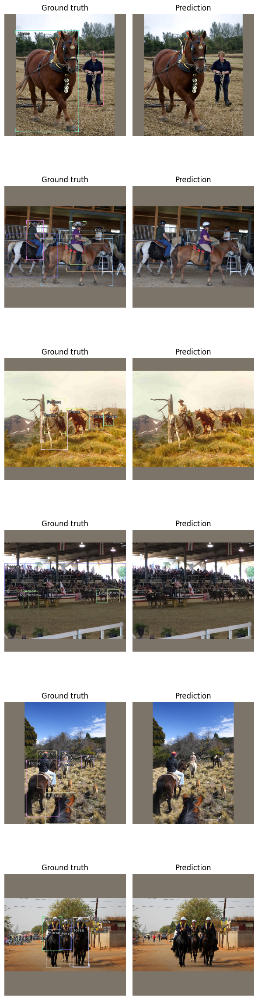

In [36]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

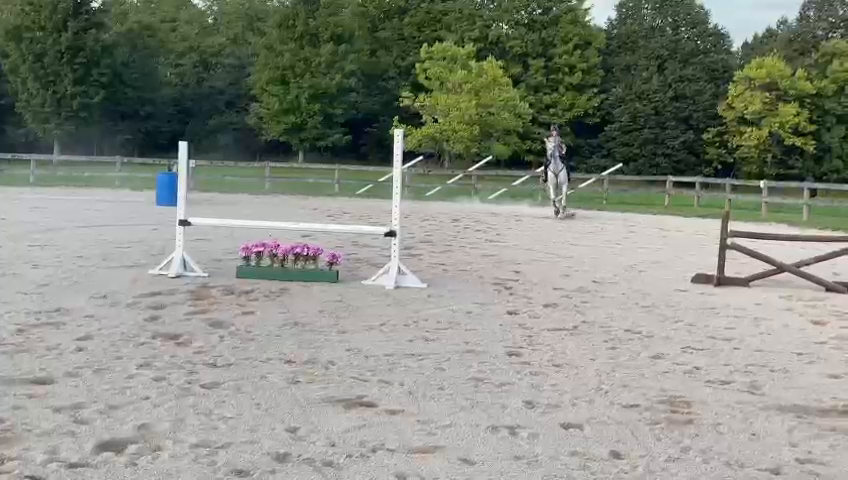

In [22]:
import PIL 

img_files = get_image_files('/home/shyndman/dev/learning-ml/arena-autocam/sample-inference-data/inference-source-1-frames')
img = PIL.Image.open(img_files[10])
img

In [34]:
from pathlib import Path

# Create a dataset
imgs_array = [PIL.Image.open(Path(fname)) for fname in img_files]
infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map=parser.class_map)

# Batch Inference
infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/28 [00:00<?, ?it/s]

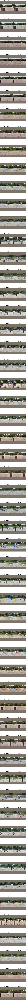

In [35]:
show_preds(preds=preds[0:100], display_label=False)